# Cyberbulling Prediction using Naive Bayes and Support Vector Machine

Cyberbullying is when someone uses social media or the internet to insult, threaten, or harm others. Sadly, it's becoming more and more common—especially on platforms like Twitter, where people can easily post harmful comments.

This project tries to help solve that problem by using machine learning—a kind of computer intelligence that can learn from data. 

#### **Algorithms Used:**
1. **Naïve Bayes:** Effective for text classification.
2. **Support Vector Machine (SVM):** Works well for high-dimensional data.

## **Description of the Dataset**

We collected a dataset of tweets. Each tweet has a label that says whether it’s an example of cyberbullying or not.We train two models—Naive Bayes and SVM—to recognize the words and patterns commonly used in bullying tweets. The models look at things like what words appear, how often they appear, and the style of writing.

By doing this, the computer starts to learn what cyberbullying sounds like, so it can make predictions about new tweets it has never seen before. This helps us build systems that can automatically detect harmful behavior online, which is an important step in making social media safer for everyone.

## **Columns in the Dataset:** 

1. **Tweet Text:** The textual content of the tweet.
2. **Label:** Indicates whether the tweet is classified as cyberbullying (1) or not (0).

## **Objectives from the Dataset** 

1. Analyze tweet data to identify patterns associated with cyberbullying.
2. Develop predictive models using Naive Bayes and SVM.
3. Compare the performance of both models to determine the most effective approach.
4. Provide insights into improving cyberbullying detection on social media platforms.

## **Solution to the Objectives** 
1. **Data Preprocessing:** Cleaning and preparing tweet data for analysis.
2. **Feature Extraction:** Converting text data into numerical features.
3. **Model Building:** Training Naive Bayes and SVM models.
4. **Model Evaluation** Comparing model accuracy and performance.
5. **Result Analysis:** Identifying strengths and weaknesses of each model.

## **Conclusion**  

By employing Naive Bayes and SVM, this project contributes to the development of efficient cyberbullying detection methods. The insights gained can aid in creating safer online environments by promptly identifying harmful interactions.

In [2]:
import pandas as pd
import numpy
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from nltk.corpus import stopwords
import re
import string

1. **pandas**: Handles datasets.
2. **numpy**: Supports numerical operations.
3. **matplotlib.pyplot & seaborn**: Used for data visualization.
4. **nltk.stopwords**: Helps in text preprocessing (removing unnecessary words).
5. **re & string**: Used for text cleaning.

In [4]:
data = pd.read_csv('cyberbullying_tweets.csv')

- The dataset cyberbullying_tweets.csv is loaded into a Pandas DataFrame.

In [6]:
data.head()

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying


- Displays the first 5 rows of the dataset.

**Columns:**
1. tweet_text: The actual tweet.
2. cyberbullying_type: Labels if the tweet is cyberbullying or not.

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


# Checking Null Values

In [10]:
data.isnull().sum()

tweet_text            0
cyberbullying_type    0
dtype: int64

**data.isnull()**
- This checks every cell in your DataFrame.
- It returns True if a value is missing (NaN), and False if it’s not.

**.sum()**
- Since True is treated as 1 and False as 0 in Python,
- sum() adds up all the True values, giving you the total number of missing values in each column.

In [12]:
data['cyberbullying_type'].value_counts()

cyberbullying_type
religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: count, dtype: int64

- Counts the number of tweets per category (cyberbullying/not cyberbullying).

# Renaming Columns

In [15]:
data = data.rename(columns={'tweet_text': 'text', 'cyberbullying_type': 'sentiment'})

- data.rename(): Renames columns in the DataFrame.
- columns={}: A dictionary specifying which columns to rename.
- 'tweet_text': 'text' → Changes the column name from "tweet_text" to "text".
- 'cyberbullying_type': 'sentiment' → Changes the column name from "cyberbullying_type" to "sentiment".
- data =: Assigns the modified DataFrame back to data, updating it in place.

# Encoding Columns

In [18]:
data["sentiment_encoded"] = data['sentiment'].replace({"religion": 1, "age": 2, "ethnicity": 3, "gender": 4, "other_cyberbullying": 5,"not_cyberbullying": 6})

C:\Users\RAJ\AppData\Local\Temp\ipykernel_13184\4172926911.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data["sentiment_encoded"] = data['sentiment'].replace({"religion": 1, "age": 2, "ethnicity": 3, "gender": 4, "other_cyberbullying": 5,"not_cyberbullying": 6})


- data['sentiment'] → Selects the sentiment column from the DataFrame.
- .replace({...}) → Replaces categorical values with numerical codes.

**The dictionary inside replace() maps each sentiment type to a unique integer value:**
- "religion" → 1
- "age" → 2
- "ethnicity" → 3
- "gender" → 4
- "other_cyberbullying" → 5
- "not_cyberbullying" → 6

- data["sentiment_encoded"] = ... → Creates a new column, sentiment_encoded, to store the numerical labels.

In [20]:
data.sample(10)

,text,sentiment,sentiment_encoded
15363,If she was emotional you'd blame gender too @o...,gender,4
11168,I carnt see the pretty..... I think they qu...,gender,4
27227,@ShriekAPotomos @CrashOverrideNW As to if I'm ...,other_cyberbullying,5
26148,i don't trust nobody around my boyfriend perio...,other_cyberbullying,5
9127,Bolsonaro is racist sexist anti-LGBT just like...,gender,4
46326,"@marshannn: “@tayyoung_: FUCK OBAMA, dumb ass ...",ethnicity,3
24385,everyone in this house can u jst leeve me alon...,other_cyberbullying,5
43842,So you get your cousin or sister to hit me? Th...,ethnicity,3
41359,“@Tjones3221: Seahawks are a bunch of dumb nig...,ethnicity,3
1552,"@AllJessieJOrkut e @JessieJBrFans ""Who's Laugh...",not_cyberbullying,6


In [21]:
stop_words = set(stopwords.words('english'))

# Fucntion to Convert text to lowercase, remove (/r, /n characters), URLs, non-utf characters, Numbers, punctuations,stopwords

In [23]:
def strip_all_entities(text): 
    text = text.replace('\r', '').replace('\n', ' ').lower()
    text = re.sub(r"(?:\@|https?\://)\S+", "", text)
    text = re.sub(r'[^\x00-\x7f]',r'', text)
    text = re.sub(r'(.)1+', r'1', text)
    text = re.sub('[0-9]+', '', text)
    stopchars= string.punctuation
    table = str.maketrans('', '', stopchars)
    text = text.translate(table)
    text = [word for word in text.split() if word not in stop_words]
    text = ' '.join(text)
    return text

1. - Removes line breaks (\r, \n) so the text is in a single line.
    - Converts text to lowercase for uniformity.
 
2. - Removes Twitter mentions (@username).
    - Removes URLs (http://example.com).
3. - Removes non-English characters (like emojis, special symbols).

4. - Removes excessive repeated letters (e.g., "sooo coool" → "so cool").

5. - Removes all digits from the text

6. - Removes all punctuation (e.g., !@#$%^&*())

# Function to remove contractions


In [26]:
def decontract(text):
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    return text

In [27]:
def preprocess(text):
    text = decontract(text)
    text = strip_all_entities(text)
    return text

In [28]:
data

,text,sentiment,sentiment_encoded
0,"In other words #katandandre, your food was cra...",not_cyberbullying,6
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,6
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,6
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,6
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,6
...,...,...,...
47687,"Black ppl aren't expected to do anything, depe...",ethnicity,3
47688,Turner did not withhold his disappointment. Tu...,ethnicity,3
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity,3
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,ethnicity,3


In [29]:
data['cleaned_text'] = data['text'].apply(preprocess)
data.head()

,text,sentiment,sentiment_encoded,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,6,words katandandre food crapilicious mkr
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,6,aussietv white mkr theblock imacelebrityau tod...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,6,classy whore red velvet cupcakes
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,6,meh p thanks heads concerned another angry dud...
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,6,isis account pretending kurdish account like i...


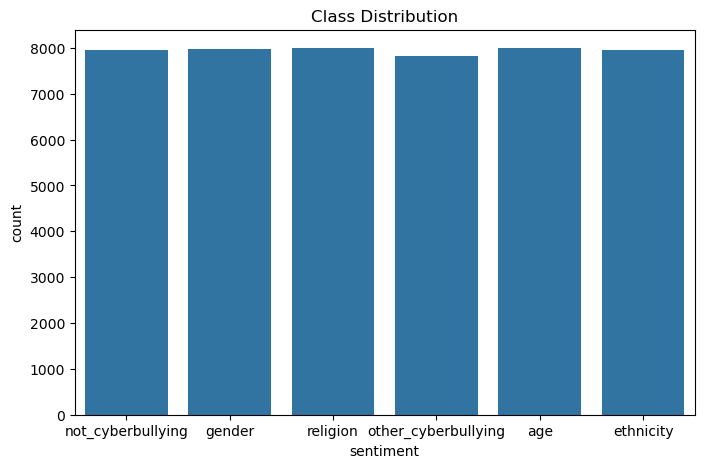

In [30]:
# Plotting distribution of classes in dataset to see if there's an imbalance
plt.figure(figsize=(8, 5))
sns.countplot(x='sentiment', data=data)
plt.title('Class Distribution')
plt.show()

Inference : Well-balanced classes, hence no action required.

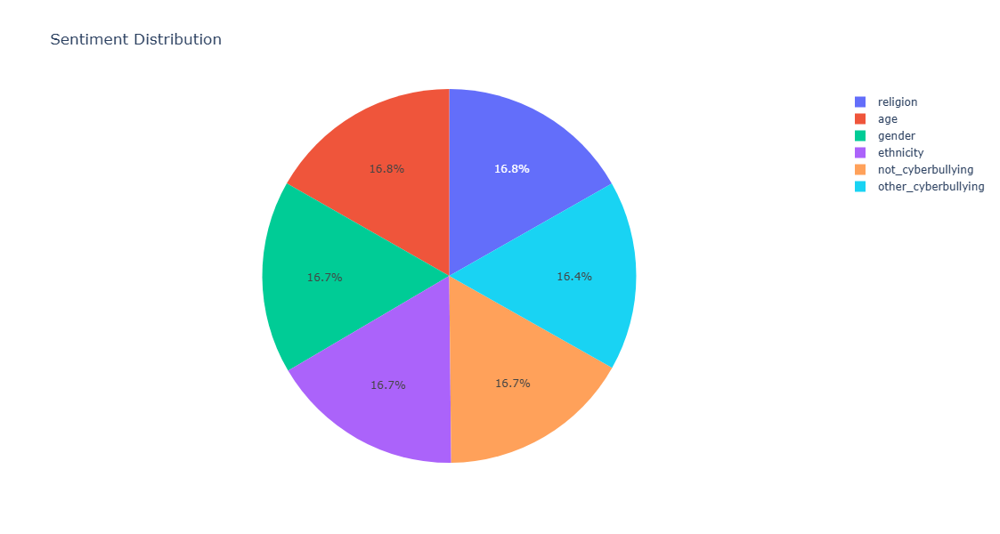

In [32]:
#Plotting pie chart to see distribution of each sentiment
import plotly.express as px

fig = px.pie(data, names='sentiment', title='Sentiment Distribution')
fig.update_layout(width=900, height=600)
fig.show()


The the sentiments are almost equally distributed

1. px.pie(data, names='sentiment'):
       - data → The dataset containing sentiment labels.
       - names='sentiment' → Groups the data by unique sentiment values (e.g., Positive, Negative, Neutral).
       - Counts the occurrences of each sentiment and represents them as slices of the pie.
       
    - title='Sentiment Distribution' sets the title of the chart.

  
2. Sets the width to 900px and height to 600px for better visibility.

3. Displays the interactive pie chart where:
    - Each slice represents a sentiment category.
    - Hovering over a slice shows the percentage and count

In [34]:
def unique_word_share(text):
    words = text.split()
    word_count = len(words)
    unique_word_count = len(set([w.lower() for w in words]))
    word_uniqueness = round(unique_word_count * 100/word_count,2)
    return word_uniqueness

data['lexical_uniqueness'] = data['text'].apply(unique_word_share)

- This function takes a text input (a tweet, sentence, or document).

-  Splits the text into words using spaces as the delimiter.

-  Counts the total number of words in the text.

- Converts words to lowercase to avoid case-sensitive duplicates ("Great" and "great" are the same).
- Uses set() to remove duplicate words and count unique words

- Applies unique_word_share() to each text entry in the data['text'] column.

- Stores the computed uniqueness score in a new column: lexical_uniqueness.

In [36]:
fig = px.box(data,
             x = 'sentiment',
             y = 'lexical_uniqueness',
             color = 'sentiment',
             color_discrete_sequence = px.colors.diverging.Spectral_r,
             template = 'plotly_dark',
             title = 'Boxplot of Lexical Uniqueness per class')


fig.show()

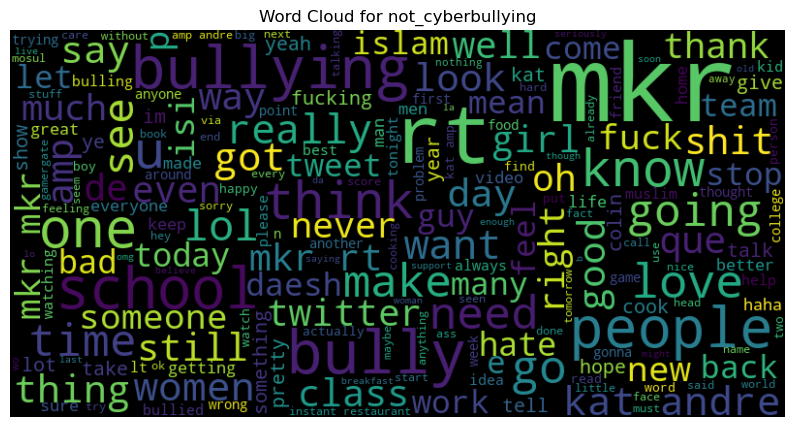

In [37]:
from wordcloud import WordCloud

target_sentiment = 'not_cyberbullying'

# Combining cleaned text for the selected sentiment class
sentiment_text = ' '.join(data[data['sentiment'] == target_sentiment]['cleaned_text'])

# Check if there are words available
if sentiment_text:
    wordcloud = WordCloud(width=800, height=400, random_state=42, max_font_size=110).generate(sentiment_text)

    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {target_sentiment}')
    plt.show()
else:
    print(f"No words available for {target_sentiment}. Check your data or preprocessing steps.")


words like bullying,bully ,mkr,rtwomen,class are occuring more often

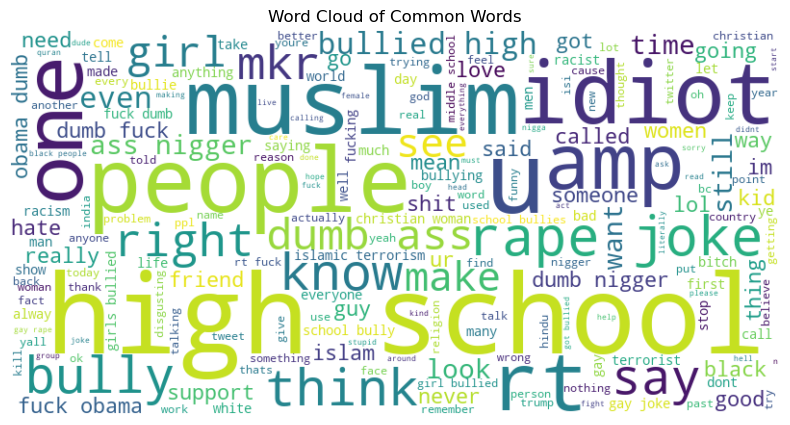

In [39]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(data['cleaned_text']))

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Common Words')
plt.show()


The most common words are school,people,high,muslim,bully etc

In [41]:
#Vectorization
from sklearn.feature_extraction.text import TfidfVectorizer #TF-IDF (Term Frequency - Inverse Document Frequency)
from sklearn.model_selection import train_test_split

X = data['cleaned_text']
Y = data['sentiment_encoded']

In [42]:
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Create a TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000)

# Fit and transform the training data
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Transform the testing data using the same vectorizer
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [43]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report

# Creating and training a Multinomial Naive Bayes model
model = MultinomialNB()
model.fit(X_train_tfidf, Y_train)

# Predicting on the testing set
y_pred = model.predict(X_test_tfidf)

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_report(Y_test, y_pred))


Accuracy: 0.7594087430548275
Classification Report:
              precision    recall  f1-score   support

           1       0.83      0.96      0.89      1566
           2       0.80      0.96      0.87      1603
           3       0.86      0.91      0.88      1603
           4       0.76      0.80      0.78      1531
           5       0.58      0.51      0.55      1612
           6       0.64      0.42      0.51      1624

    accuracy                           0.76      9539
   macro avg       0.75      0.76      0.75      9539
weighted avg       0.74      0.76      0.75      9539



1. **Overall Accuracy:** The model achieves an accuracy of 75.9%, indicating its effectiveness in sentiment classification, though there's room for improvement.

2. **Class-Specific Performance:** High precision in classes 1, 2, and 3 demonstrates accurate identification of positive sentiments, while lower precision and recall in classes 5 and 6 suggest challenges in distinguishing between negative sentiments.

3. **Balanced Metrics:** Despite variations, the model maintains balanced precision, recall, and F1-score metrics, reflecting fair performance across multiple sentiment classes.

4. **Areas for Enhancement:** Consider refining the model to better capture nuances in negative sentiments, potentially through feature engineering or exploring more sophisticated algorithms.

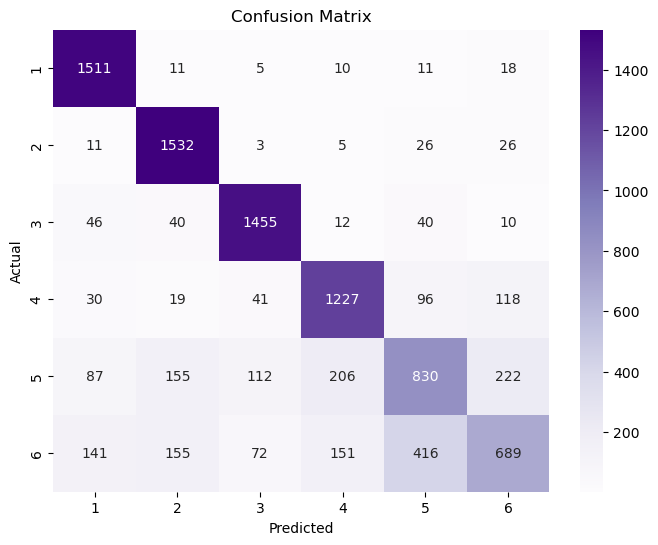

In [45]:
## Import the confusion_matrix function to evaluate classification results
from sklearn.metrics import confusion_matrix

## Generate the confusion matrix by comparing actual labels (Y_test) with predicted labels (y_pred)
conf_matrix = confusion_matrix(Y_test, y_pred)

## Create a new figure with a specific size for the heatmap plot
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

- Plot the confusion matrix using Seaborn's heatmap
- **annot=True:** display the numbers in each cell
- **fmt="d":** format those numbers as integers
- **cmap="Purples":** use the "Purples" color scheme
- **xticklabels and yticklabels:** label rows/columns using class names from the model

In [47]:
from sklearn.svm import LinearSVC

svm_model = LinearSVC()
svm_model.fit(X_train_tfidf, Y_train)

y_pred_svm = svm_model.predict(X_test_tfidf)

- **LinearSVC** is good for text classification because it handles high-dimensional data efficiently.
- **fit(...)** trains the model.
- **predict(...)** generates predictions for unseen test data.

In [49]:
# Evaluate the SVM model
accuracy_svm = accuracy_score(Y_test, y_pred_svm)
print(f"SVM Accuracy: {accuracy_svm}")
print("SVM Classification Report:")
print(classification_report(Y_test, y_pred_svm))


SVM Accuracy: 0.8158087849879442
SVM Classification Report:
              precision    recall  f1-score   support

           1       0.94      0.95      0.94      1566
           2       0.95      0.97      0.96      1603
           3       0.98      0.97      0.97      1603
           4       0.87      0.83      0.85      1531
           5       0.58      0.68      0.63      1612
           6       0.59      0.52      0.55      1624

    accuracy                           0.82      9539
   macro avg       0.82      0.82      0.82      9539
weighted avg       0.82      0.82      0.82      9539



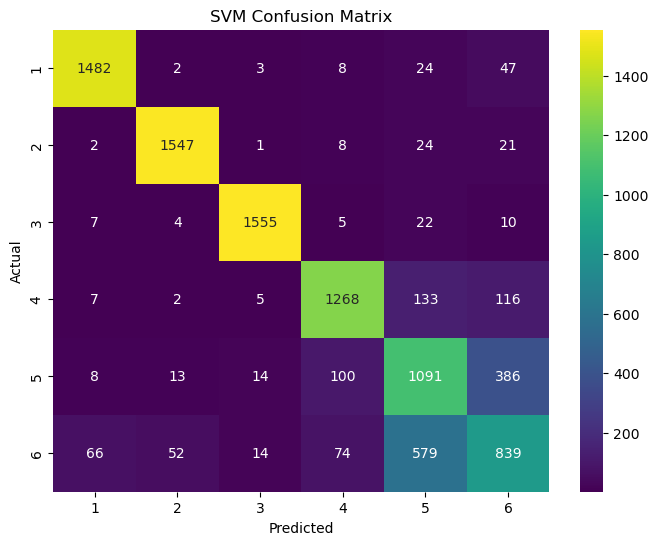

In [50]:
# Visualize the SVM confusion matrix
conf_matrix_svm = confusion_matrix(Y_test, y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_svm, annot=True, fmt="d", cmap="viridis", xticklabels=svm_model.classes_, yticklabels=svm_model.classes_)
plt.title('SVM Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

1. **Overall Accuracy:** The SVM model achieves an accuracy of 81.6%, indicating its capability in correctly classifying sentiments across diverse categories.

2. **Precision and Recall:** Precision and recall metrics showcase strong performance, with high values for most classes, emphasizing the model's ability to make accurate predictions and capture relevant instances.

3. **Class-Specific Analysis:** Notably high precision in classes 1, 2, and 3 reflects accurate identification of positive sentiments, while balanced precision-recall in classes 4, 5, and 6 suggests robust handling of neutral and negative sentiments.

4. **Room for Improvement:** Although overall performance is good, there's potential for enhancement, particularly in distinguishing between closely related sentiment categories. Further optimization or exploring advanced models may address these nuances.

**Conclusion**

The Naive Bayes and Support Vector Machines (SVM) models prove effective in predicting cyberbullying within tweet texts. Leveraging their respective strengths, these models accurately classify content, offering valuable insights into online dynamics. This work contributes to creating a safer digital space by identifying and addressing instances of cyberbullying on social media platforms.

In [53]:
# import pickle

# # Save the trained model
# with open('svm_model.pkl', 'wb') as file:
#     pickle.dump(model, file)


In [54]:
import pickle

pickle.dump(svm_model,open('svm_model.pkl','wb'))